# Dreambooth
### Notebook implementation by Joe Penna (@MysteryGuitarM on Twitter) - Improvements by David Bielejeski

### Instructions
- Sign up for RunPod here: https://runpod.io/?ref=n8yfwyum
    - Note: That's my personal referral link. Please don't use it if we are mortal enemies.

- Click *Deploy* on either `SECURE CLOUD` or `COMMUNITY CLOUD`

- Follow the rest of the instructions in this video: https://www.youtube.com/watch?v=7m__xadX0z0#t=5m33.1s

Latest information on:
https://github.com/JoePenna/Dreambooth-Stable-Diffusion

## Build Environment

In [1]:
# BUILD ENV
!pip install omegaconf
!pip install einops
!pip install pytorch-lightning==1.6.5
!pip install test-tube
!pip install transformers
!pip install kornia
!pip install -e git+https://github.com/CompVis/taming-transformers.git@master#egg=taming-transformers
!pip install -e git+https://github.com/openai/CLIP.git@main#egg=clip
!pip install setuptools==59.5.0
!pip install pillow==9.0.1
!pip install torchmetrics==0.6.0
!pip install -e .
!pip install protobuf==3.20.1
!pip install gdown
!pip install -qq diffusers["training"]==0.3.0 transformers ftfy
!pip install -qq "ipywidgets>=7,<8"
!pip install huggingface_hub==0.11.0
!pip install ipywidgets==7.7.1
!pip install captionizer==1.0.1


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 KB 8.6 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 47.4 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
  Attempting uninstall: pytorch-lightning
    Found existing installation: pytorch-lightning 1.7.7
    Uninstalling pytorch-lightning-1.7.7:
      Successfully uninstalled pytorch-lightning-1.7.7
Obtaining taming-transformers from git+https://github.com/CompVis/taming-transformers.git@master#egg=taming-transformers
  Cloning https://github.com/CompVis/taming-transformers.git (to revision master) to /invokeai/.venv/src/taming-transformers
  Running command git clone --filter=blob:none --quiet https://github.com/CompVis/taming-transformers.git /invokeai/.venv/src/taming-transformers
  Resolved https://github.com/CompVis/taming-transformers.git to commit 3ba01b24

In [3]:
# Hugging Face Login
from huggingface_hub import interpreter_login

interpreter_login()


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To login, `huggingface_hub` now requires a token generated from https://huggingface.co/settings/tokens .
    


Token:  ········
Add token as git credential? (Y/n)  Y


Token is valid.
Cannot authenticate through git-credential as no helper is defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub.
Run the following command in your terminal in case you want to set the 'store' credential helper as default.

git config --global credential.helper store

Read https://git-scm.com/book/en/v2/Git-Tools-Credential-Storage for more details.
Token has not been saved to git credential helper.
Your token has been saved to /root/.huggingface/token
Login successful


In [4]:
# Download the 1.4 sd model
from IPython.display import clear_output

from huggingface_hub import hf_hub_download
downloaded_model_path = hf_hub_download(
 repo_id="CompVis/stable-diffusion-v-1-4-original",
 filename="sd-v1-4.ckpt",
 use_auth_token=True
)

# Move the sd-v1-4.ckpt to the root of this directory as "model.ckpt"
actual_locations_of_model_blob = !readlink -f {downloaded_model_path}
!mv {actual_locations_of_model_blob[-1]} model.ckpt
clear_output()
print("✅ model.ckpt successfully downloaded")

✅ model.ckpt successfully downloaded


In [5]:
!ls -l

total 4172576
-rw-r--r-- 1 root root       1125 Jan  7 03:33 LICENSE
-rw-r--r-- 1 root root      11630 Jan  7 03:33 README.md
drwxr-xr-x 2 root root       4096 Jan  7 03:33 assets
drwxr-xr-x 5 root root         89 Jan  7 03:33 configs
drwxr-xr-x 2 root root         36 Jan  7 03:33 data
-rw-r--r-- 1 root root       8458 Jan  7 03:33 dreambooth_colab_joepenna.ipynb
-rw-r--r-- 1 root root      61023 Jan  7 03:43 dreambooth_runpod_joepenna.ipynb
-rw-r--r-- 1 root root        764 Jan  7 03:33 environment.yaml
drwxr-xr-x 2 root root         34 Jan  7 03:33 evaluation
-rw-r--r-- 1 root root    7178600 Jan  7 03:33 gdrive
drwxr-xr-x 2 root root        134 Jan  7 03:34 latent_diffusion.egg-info
drwxr-xr-x 5 root root        130 Jan  7 03:33 ldm
-rw-r--r-- 1 root root      33492 Jan  7 03:33 main.py
-rw-r--r-- 1 root root       3706 Jan  7 03:33 merge_embeddings.py
-rw------- 1 root root 4265380512 Jan  7 03:42 model.ckpt
drwxr-xr-x 4 root root         55 Jan  7 03:33 models
-rw-r--r-- 1 root ro

# Regularization Images (Skip this section if you are uploading your own or using the provided images)

Training teaches your new model both your token **but** re-trains your class simultaneously.

From cursory testing, it does not seem like reg images affect the model too much. However, they do affect your class greatly, which will in turn affect your generations.

You can either generate your images here, or use the repos below to quickly download 1500 images.

In [6]:
# GENERATE 200 images - Optional
self_generated_files_prompt = "person" #@param {type:"string"}
self_generated_files_count = 200 #@param {type:"integer"}

!python scripts/stable_txt2img.py \
 --seed 10 \
 --ddim_eta 0.0 \
 --n_samples 1 \
 --n_iter {self_generated_files_count} \
 --scale 10.0 \
 --ddim_steps 50 \
 --ckpt model.ckpt \
 --prompt {self_generated_files_prompt}

dataset=self_generated_files_prompt

!mkdir -p regularization_images/{dataset}
!mv outputs/txt2img-samples/*.png regularization_images/{dataset}

Global seed set to 10
Loading model from model.ckpt
Global Step: 470000
   | LatentDiffusion: Running in eps-prediction mode
   | DiffusionWrapper has 859.52 M params.
   | Making attention of type 'vanilla' with 512 in_channels
   | Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
   | Making attention of type 'vanilla' with 512 in_channels
Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.20.layer_norm1.bias', 'vision_model.encoder.layers.6.self_attn.k_proj.weight', 'vision_model.encoder.layers.19.self_attn.k_proj.weight', 'vision_model.encoder.layers.9.self_attn.k_proj.weight', 'vision_model.encoder.layers.10.self_attn.q_proj.weight', 'vision_model.encoder.layers.20.mlp.fc2.bias', 'vision_model.encoder.layers.20.self_attn.k_proj.bias', 'vision_model.encoder.layers.23.mlp.fc2.weight', 'vision_model.encoder.layers.14.layer_norm2.weight', 'vision_model.encoder.layers.15.self_attn.k

In [ ]:
# Zip up the files for downloading and reuse.
# Download this file locally so you can reuse during another training on this dataset
!apt-get install -y zip
!zip -r regularization_images.zip regularization_images/{dataset}

# Download pre-generated regularization images
We've created the following image sets

`man_euler` - provided by Niko Pueringer (Corridor Digital) - euler @ 40 steps, CFG 7.5
`man_unsplash` - pictures from various photographers
`person_ddim`
`woman_ddim` - provided by David Bielejeski - ddim @ 50 steps, CFG 10.0
`person_ddim` is recommended

In [7]:
#Download Regularization Images

dataset="person_ddim" #@param ["man_euler", "man_unsplash", "person_ddim", "woman_ddim", "blonde_woman"]
!git clone https://github.com/djbielejeski/Stable-Diffusion-Regularization-Images-{dataset}.git

!mkdir -p regularization_images/{dataset}
!mv -v Stable-Diffusion-Regularization-Images-{dataset}/{dataset}/*.* regularization_images/{dataset}

Cloning into 'Stable-Diffusion-Regularization-Images-person_ddim'...
remote: Enumerating objects: 1503, done.
remote: Total 1503 (delta 0), reused 0 (delta 0), pack-reused 1503
Receiving objects: 100% (1503/1503), 657.41 MiB | 29.45 MiB/s, done.
Updating files: 100% (1500/1500), done.
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00000.png' -> 'regularization_images/person_ddim/person_ddim_00000.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00001.png' -> 'regularization_images/person_ddim/person_ddim_00001.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00002.png' -> 'regularization_images/person_ddim/person_ddim_00002.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00003.png' -> 'regularization_images/person_ddim/person_ddim_00003.png'
renamed 'Stable-Diffusion-Regularization-Images-person_ddim/person_ddim/person_ddim_00004.

# Upload your training images
Upload 10-20 images of someone to

```
/workspace/Dreambooth-Stable-Diffusion/training_images
```

WARNING: Be sure to upload an *even* amount of images, otherwise the training inexplicably stops at 1500 steps.

*   2-3 full body
*   3-5 upper body
*   5-12 close-up on face

The images should be:

- as close as possible to the kind of images you're trying to make

usage: gh [-h] [--home] [-p] [-b] [-s] [-r] [-t] [-c] [-w] [-i] [-d] [-v]

Github browser opener

options:
  -h, --help           show this help message and exit
  --home               Open at the home page (Default action)
  -p, --pulls          Open at pull requests page
  -b, --branches       Open at Branches page
  -s, --settings       Open at Settings page
  -r, --releases       Open at Releases page
  -t, --tags           Open at Tags page
  -c, --collaboration  Open at collaboration page
  -w, --wiki           Open at Wiki
  -i, --issues         Open at Issues page
  -d, --debug          Enable debug output
  -v, --version        Show the installed version of gh


In [41]:
import os

# Set the path to the folder you want to open
photo_path = "./training_photos"

# Initialize an empty list to store the file paths
files = []

# Use the os.listdir function to get a list of all files in the folder
for file in os.listdir(photo_path):
    # Use the os.path.join function to get the full path of each file
    file_path = os.path.join(photo_path, file)
    # Add the file path to the list
    files.append(file_path)

# Print the list of file paths
print(files)

['./training_photos/DSC02241.jpg', './training_photos/3ec6bd72-fa47-49ba-8a90-7a47286ab7fd.jpg', './training_photos/3d4264de-835f-4ac5-bf61-7bc6d48e373d.jpg', './training_photos/WX20230107-142003@2x.png', './training_photos/WX20230107-141639@2x.png', './training_photos/WX20230107-141700@2x.png', './training_photos/WX20230107-141836@2x.png', './training_photos/WX20230107-141551@2x.png', './training_photos/WX20230107-141906@2x.png', './training_photos/WX20230107-141613@2x.png', './training_photos/WX20230107-141850@2x.png', './training_photos/WX20230107-141809@2x.png', './training_photos/WX20230107-141823@2x.png', './training_photos/WX20230107-141941@2x.png', './training_photos/WX20230107-142226@2x.png', './training_photos/WX20230107-141919@2x.png', './training_photos/WX20230107-141755@2x.png', './training_photos/WX20230107-141519@2x.png', './training_photos/WX20230107-142020@2x.png', './training_photos/WX20230107-141740@2x.png', './training_photos/WX20230107-141722@2x.png']


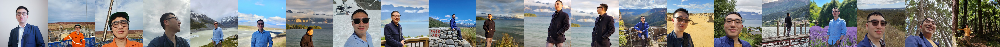

In [44]:
#@title Download and check the images you have just added
import os
import requests
from io import BytesIO
from PIL import Image


def image_grid(imgs, rows, cols):
 assert len(imgs) == rows*cols

 w, h = imgs[0].size
 grid = Image.new('RGB', size=(cols*w, rows*h))
 grid_w, grid_h = grid.size

 for i, img in enumerate(imgs):
  grid.paste(img, box=(i%cols*w, i//cols*h))
 return grid

def download_image(filePath):
 with open(filePath,'rb') as f:
     return Image.open(BytesIO(f.read())).convert("RGB")


images = list(filter(None,[download_image(file) for file in files]))
save_path = "./training_images"
if not os.path.exists(save_path):
 os.mkdir(save_path)
[image.save(f"{save_path}/{i}.png", format="png") for i, image in enumerate(images)]
image_grid(images, 1, len(images))

In [ ]:
%%bash 
git push origin main

## Training

If training a person or subject, keep an eye on your project's `logs/{folder}/images/train/samples_scaled_gs-00xxxx` generations.

If training a style, keep an eye on your project's `logs/{folder}/images/train/samples_gs-00xxxx` generations.

In [ ]:
# Training

# This isn't used for training, just to help you remember what your trained into the model.
project_name = "project_name"

# MAX STEPS
# How many steps do you want to train for?
max_training_steps = 2000

# Match class_word to the category of the regularization images you chose above.
class_word = "person" # typical uses are "man", "person", "woman"

# This is the unique token you are incorporating into the stable diffusion model.
token = "firstNameLastName"


reg_data_root = "/workspace/Dreambooth-Stable-Diffusion/regularization_images/" + dataset

!rm -rf training_images/.ipynb_checkpoints
!python "main.py" \
 --base configs/stable-diffusion/v1-finetune_unfrozen.yaml \
 -t \
 --actual_resume "model.ckpt" \
 --reg_data_root "{reg_data_root}" \
 -n "{project_name}" \
 --gpus 0, \
 --data_root "/workspace/Dreambooth-Stable-Diffusion/training_images" \
 --max_training_steps {max_training_steps} \
 --class_word "{class_word}" \
 --token "{token}" \
 --no-test

## Copy and name the checkpoint file

In [ ]:
# Copy the checkpoint into our `trained_models` folder

directory_paths = !ls -d logs/*
last_checkpoint_file = directory_paths[-1] + "/checkpoints/last.ckpt"
training_images = !find training_images/*
date_string = !date +"%Y-%m-%dT%H-%M-%S"
file_name = date_string[-1] + "_" + project_name + "_" + str(len(training_images)) + "_training_images_" +  str(max_training_steps) + "_max_training_steps_" + token + "_token_" + class_word + "_class_word.ckpt"

file_name = file_name.replace(" ", "_")

!mkdir -p trained_models
!mv "{last_checkpoint_file}" "trained_models/{file_name}"

print("Download your trained model file from trained_models/" + file_name + " and use in your favorite Stable Diffusion repo!")

# Optional - Upload to google drive
* run the following commands in a new `terminal` in the `Dreambooth-Stable-Diffusion` directory
* `chmod +x ./gdrive`
* `./gdrive about`
* `paste your token here after navigating to the link`
* `./gdrive upload trained_models/{file_name.ckpt}`

# Big Important Note!

The way to use your token is `<token> <class>` ie `joepenna person` and not just `joepenna`

## Generate Images With Your Trained Model!

In [ ]:
!python scripts/stable_txt2img.py \
 --ddim_eta 0.0 \
 --n_samples 1 \
 --n_iter 4 \
 --scale 7.0 \
 --ddim_steps 50 \
 --ckpt "/workspace/Dreambooth-Stable-Diffusion/trained_models/{file_name}" \
 --prompt "joepenna person as a masterpiece portrait painting by John Singer Sargent in the style of Rembrandt"